### Content Analysis News All with Covid
### Topic Modeling 

In [1]:
import re
import numpy as np
import pandas as pd
from pprint import pprint
from collections import Counter

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt

#TF-IDF
from sklearn.feature_extraction.text import TfidfTransformer,CountVectorizer

# spacy for lemmatization
import spacy

#nltk
from nltk.corpus import stopwords

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [2]:
def clean_address(row):
    name =  row.lower().split('/')
    if  row.lower().startswith('https') or  row.lower().startswith('http'):       
        return name[3]
    elif row.lower().startswith('www'):
        return name[1] 
    elif row.lower().startswith('facebook'):
        return name[1]
    else:
        print("Not found", row)
        return None

## 1. Reads  Info
Reads the information from all the posts from the studied period

In [3]:
import os
os.getcwd()

'/home/claudia/Documents/Latinx2020'

In [4]:

#path = "Latinx2020/"

posts = pd.read_csv("news/FB_groups_News_Media_Outlets_coronavirus.csv")
#We rename the colum Page Name to be able to concat with Group Posts
posts.rename(columns={'Page Name':'Group Name'}, inplace=True)
posts.shape

(95098, 38)

In [5]:

posts.shape

(95098, 38)

In [6]:
posts['URL']

0        https://www.facebook.com/CNNee/posts/101576770...
1        https://www.facebook.com/primerahora/posts/101...
2        https://www.facebook.com/CNNee/posts/101576846...
3        https://www.facebook.com/CNNee/posts/101576918...
4        https://www.facebook.com/primerahora/posts/979...
                               ...                        
95093    https://www.facebook.com/elnuevoherald/posts/1...
95094    https://www.facebook.com/LatinOpinionBaltimore...
95095    https://www.facebook.com/LatinOpinionBaltimore...
95096    https://www.facebook.com/LatinOpinionBaltimore...
95097    https://www.facebook.com/HuffPostLatinoVoices/...
Name: URL, Length: 95098, dtype: object

## 9. Filter the most relevant columns
### Add column to concat Message, Description, Link Text

In [7]:
concat_message = posts['Message'].fillna('') + (' ' + posts['Description']).fillna('')+ (' ' + posts['Link Text']).fillna('') + (' ' + posts['Link']).fillna('')
posts['MessageDescr'] = concat_message

concat_just_message = posts['Message'].fillna('') + (' ' + posts['Description']).fillna('')+ (' ' + posts['Link Text']).fillna('')
posts['MessageOnly'] = concat_just_message

In [8]:
posts.drop_duplicates(subset=['MessageOnly'])

,Unnamed: 0,Group Name,User Name,Facebook Id,Likes at Posting,Created,Type,Likes,Comments,Shares,...,Sponsor Id,Sponsor Name,Total Interactions,Total Interactions (weighted — Likes 1x Shares 1x Comments 1x Love 1x Wow 1x Haha 1x Sad 1x Angry 1x Care 1x ),Overperforming Score,clean_url,State,Facebook,MessageDescr,MessageOnly
0,53,CNN en Español,CNNee,89613772643,13173761.0,2020-08-18 12:36:10 EDT,Photo,13746,3206,1762,...,NaN,NaN,"25,110","25,110",9.13,cnnee,Georgia,https://www.facebook.com/CNNee,La ex primera dama de Estados Unidos Michelle ...,La ex primera dama de Estados Unidos Michelle ...
1,74,Primera Hora,primerahora,99825897726,1813505.0,2020-08-26 07:00:55 EDT,Link,8478,1249,2552,...,NaN,NaN,"19,637","19,637",44.63,primerahora,Puerto Rico,https://www.facebook.com/primerahora,Luego de estar recluido 14 días en el hospital...,Luego de estar recluido 14 días en el hospital...
2,109,CNN en Español,CNNee,89613772643,13174728.0,2020-08-21 15:20:07 EDT,Link,6711,703,3276,...,NaN,NaN,"15,157","15,157",38.96,cnnee,Georgia,https://www.facebook.com/CNNee,El turismo europeo vuelve a cerrar de golpe po...,El turismo europeo vuelve a cerrar de golpe po...
3,133,CNN en Español,CNNee,89613772643,13176291.0,2020-08-24 13:20:10 EDT,Photo,4066,1232,4256,...,NaN,NaN,"13,553","13,553",25.82,cnnee,Georgia,https://www.facebook.com/CNNee,Investigadores dicen que un hombre es el prime...,Investigadores dicen que un hombre es el prime...
4,144,Primera Hora,primerahora,99825897726,1812550.0,2020-08-19 16:31:21 EDT,Live Video Complete,1264,6851,2687,...,NaN,NaN,"12,781","12,781",5.99,primerahora,Puerto Rico,https://www.facebook.com/primerahora,Wanda Vázquez anuncia nuevas medidas contra el...,Wanda Vázquez anuncia nuevas medidas contra el...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95093,462808,El Nuevo Herald,elnuevoherald,126339201288,392629.0,2020-11-02 21:34:46 EST,Link,0,0,0,...,NaN,NaN,0,0,-112.00,elnuevoherald,Florida,https://www.facebook.com/elnuevoherald/,"El obstáculo fue grande, pero el fruto ha sido...","El obstáculo fue grande, pero el fruto ha sido..."
95094,462815,Latin Opinion Baltimore,LatinOpinionBaltimore,169130696504934,6289.0,2020-11-03 11:38:51 EST,Link,0,0,0,...,NaN,NaN,0,0,-46.00,latinopinionbaltimore,Maryland,https://www.facebook.com/LatinOpinionBaltimore/,Al #votar 🗳 revisa si hay nuevos sitios de vot...,Al #votar 🗳 revisa si hay nuevos sitios de vot...
95095,462816,Latin Opinion Baltimore,LatinOpinionBaltimore,169130696504934,6289.0,2020-11-03 10:28:04 EST,Native Video,0,0,0,...,NaN,NaN,0,0,-28.00,latinopinionbaltimore,Maryland,https://www.facebook.com/LatinOpinionBaltimore/,"“Este año, necesitamos más que su voto, necesi...","“Este año, necesitamos más que su voto, necesi..."
95096,462819,Latin Opinion Baltimore,LatinOpinionBaltimore,169130696504934,6288.0,2020-11-02 11:39:43 EST,Photo,0,0,0,...,NaN,NaN,0,0,-40.00,latinopinionbaltimore,Maryland,https://www.facebook.com/LatinOpinionBaltimore/,"Los sitios de pruebas de #COVID19 gratuita, si...","Los sitios de pruebas de #COVID19 gratuita, si..."


In [9]:
posts.shape

(95098, 38)

In [10]:
posts["Created"].head(5)

0    2020-08-18 12:36:10 EDT
1    2020-08-26 07:00:55 EDT
2    2020-08-21 15:20:07 EDT
3    2020-08-24 13:20:10 EDT
4    2020-08-19 16:31:21 EDT
Name: Created, dtype: object

In [11]:
posts['converted_date'] = pd.to_datetime(posts["Created"])
posts['converted_date']

0       2020-08-18 12:36:10-04:00
1       2020-08-26 07:00:55-04:00
2       2020-08-21 15:20:07-04:00
3       2020-08-24 13:20:10-04:00
4       2020-08-19 16:31:21-04:00
                   ...           
95093   2020-11-02 21:34:46-05:00
95094   2020-11-03 11:38:51-05:00
95095   2020-11-03 10:28:04-05:00
95096   2020-11-02 11:39:43-05:00
95097   2020-11-02 07:01:06-05:00
Name: converted_date, Length: 95098, dtype: datetime64[ns, tzlocal()]

In [12]:
posts['converted_date']=posts['converted_date'].dt.date

In [13]:
import seaborn as sns
pd.set_option('display.max_rows', None)
group_date = posts.groupby('converted_date').agg({'Facebook Id':'count'}).reset_index().rename(columns={'Facebook Id':'count'})
group_date


,converted_date,count
0,2020-08-18,1684
1,2020-08-19,1710
2,2020-08-20,1469
3,2020-08-21,1353
4,2020-08-22,992
5,2020-08-23,955
6,2020-08-24,1413
7,2020-08-25,1476
8,2020-08-26,1422
9,2020-08-27,1549


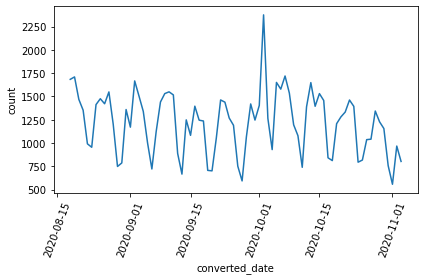

In [14]:
sns.lineplot(data=group_date, x='converted_date', y='count')
plt.xticks(rotation=70)
plt.tight_layout()

In [15]:
posts[posts['Link Text'].str.lower().str.contains("í", na = False)].head(1)

,Unnamed: 0,Group Name,User Name,Facebook Id,Likes at Posting,Created,Type,Likes,Comments,Shares,...,Sponsor Name,Total Interactions,Total Interactions (weighted — Likes 1x Shares 1x Comments 1x Love 1x Wow 1x Haha 1x Sad 1x Angry 1x Care 1x ),Overperforming Score,clean_url,State,Facebook,MessageDescr,MessageOnly,converted_date
17,421,CNN en Español,CNNee,89613772643,13175191.0,2020-08-22 15:15:07 EDT,Link,1629,856,1056,...,NaN,"5,101","5,101",13.11,cnnee,Georgia,https://www.facebook.com/CNNee,Estos son los países de América con la mayor t...,Estos son los países de América con la mayor t...,2020-08-22


In [16]:
#!/usr/bin/env python
import re

text = u'This is a smiley face \U0001f602'
print(text) # with emoji

def deEmojify(text):
    
    regrex_pattern = re.compile(pattern = "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                          
                           "]+", flags = re.UNICODE)
    
    
    return regrex_pattern.sub(r'',text)

print(deEmojify(text))

def deEmojify(inputString):
    return inputString.encode('ascii', 'ignore').decode('ascii')

This is a smiley face 😂
This is a smiley face 


In [17]:

posts['Group Name']=posts['Group Name'].apply(deEmojify)
posts['Group Name']=posts['Group Name'].apply(lambda i: i.replace('"', ''))
posts['Group Name']=posts['Group Name'].apply(lambda i: i.replace(',', ''))
posts['Facebook Id'] = posts['Facebook Id'].astype(int)



### 4. US states

In [18]:
us_states = pd.DataFrame({'State':['Alabama','Alaska','Arizona','Arkansas','California','Colorado','Connecticut','Delaware','District of Columbia','Florida',
             'Georgia','Hawaii','Idaho','Illinois','Indiana','Iowa','Kansas','Kentucky','Louisiana','Maine','Maryland','Massachusetts',
             'Michigan','Minnesota','Mississippi','Missouri','Montana','Nebraska','Nevada','New Hampshire','New Jersey','New Mexico',
             'New York','North Carolina','North Dakota','Ohio','Oklahoma','Oregon','Pennsylvania','Rhode Island','South Carolina',
             'South Dakota','Tennessee','Texas','Utah','Vermont','Virginia','Washington','West Virginia','Wisconsin','Wyoming']})

## 3. Which groups are publishing the majority of the content

In [19]:
group = posts.groupby(['Group Name'])
final_groups = group.agg({'Facebook Id':'count'}).sort_values(by='Facebook Id',ascending=False)
final_groups

,Facebook Id
Group Name,
CNN en Espaol,4252
La Noticia,3556
NoticiasYa Colorado,2646
NoticiasYa San Diego,2102
El Vocero de Puerto Rico,1707
NoticiasYa Costa Central,1552
NoticiasYa Nevada,1510
NoticiasYa El Centro,1492
Telemundo Nueva Inglaterra,1406


## Tokenize words and Clean-up text

In [20]:
content = posts.copy()
content.drop_duplicates(subset= ['MessageDescr'], inplace=True)
content['MessageDescr']

0        La ex primera dama de Estados Unidos Michelle ...
1        Luego de estar recluido 14 días en el hospital...
2        El turismo europeo vuelve a cerrar de golpe po...
3        Investigadores dicen que un hombre es el prime...
4        Wanda Vázquez anuncia nuevas medidas contra el...
5        Los reportes también señalan que cuando el Par...
6        🎬 ¡Regresa la pantalla grande! #CiudadJuárez P...
7        Wuhan, la capital de la provincia de Hubei, en...
8        Wanda Vázquez anuncia nuevas medidas contra el...
9        ¡Buenas noticias! Bebé de dos meses supera el ...
10       En momentos donde la pandemia golpea con fuerz...
11       Los pueblos con menor prevalencia de casos pud...
12       En Google, Messi fue lo más buscado este marte...
13       ¡Buenas noticias! Anoche no pudieron hacer el ...
14       🗣 'Espero que no haya vacuna para estas person...
15       No están en ventiladores, pero están en intens...
16        El secretario del Departamento de Salud, Lore.

In [21]:
content['cleanMessage'] = content['MessageDescr'].apply(lambda x: re.split('https:\/\/.*', str(x))[0])
content['cleanMessage'].shape

(71314,)

In [22]:
# Convert to list
data = content.cleanMessage.tolist()

In [23]:
# Remove new line characters
data = [re.sub('\s+', ' ', sent) for sent in data]

# Remove distracting single quotes
data = [re.sub("\'", "", sent) for sent in data]


In [24]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(data))

print(data_words[:2])

[['la', 'ex', 'primera', 'dama', 'de', 'estados', 'unidos', 'michelle', 'obama', 'dio', 'un', 'apasionado', 'discurso', 'en', 'el', 'que', 'hablo', 'del', 'caracter', 'de', 'joe', 'biden', 'para', 'convertirse', 'en', 'presidente', 'lo', 'contrasto', 'con', 'una', 'fuerte', 'critica', 'la', 'administracion', 'del', 'presidente', 'donald', 'trump', 'por', 'su', 'manejo', 'de', 'la', 'pandemia', 'las', 'tensiones', 'raciales', 'en', 'el', 'pais', 'entre', 'otros', 'temas', 'no', 'puede', 'afrontar', 'este', 'momento', 'simplemente', 'no', 'puede', 'ser', 'quien', 'necesitamos', 'que', 'sea', 'para', 'nosotros', 'dijo', 'obama', 'la', 'ex', 'primera', 'dama', 'dijo', 'que', 'biden', 'comprende', 'las', 'perdidas', 'que', 'enfrentan', 'muchos', 'estadounidenses', 'en', 'este', 'momento', 'pues', 'el', 'mismo', 'ha', 'tenido', 'perdidas', 'inimaginables', 'su', 'vida', 'es', 'un', 'testimonio', 'de', 'que', 'se', 'ha', 'recuperado', 'va', 'canalizar', 'esa', 'misma', 'determinacion', 'pasio

#### Creating Bigram and Trigram Models

In [25]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[data_words[0]]])

['la', 'ex_primera_dama', 'de', 'estados_unidos', 'michelle_obama', 'dio', 'un', 'apasionado', 'discurso', 'en', 'el', 'que', 'hablo', 'del', 'caracter', 'de', 'joe_biden', 'para', 'convertirse', 'en', 'presidente', 'lo', 'contrasto', 'con', 'una', 'fuerte', 'critica', 'la', 'administracion', 'del', 'presidente', 'donald', 'trump', 'por', 'su', 'manejo', 'de', 'la', 'pandemia', 'las', 'tensiones_raciales', 'en', 'el', 'pais', 'entre', 'otros', 'temas', 'no', 'puede', 'afrontar', 'este', 'momento', 'simplemente', 'no', 'puede', 'ser', 'quien', 'necesitamos', 'que', 'sea', 'para', 'nosotros', 'dijo', 'obama', 'la', 'ex_primera_dama', 'dijo', 'que', 'biden', 'comprende', 'las', 'perdidas', 'que', 'enfrentan', 'muchos', 'estadounidenses', 'en', 'este', 'momento', 'pues', 'el', 'mismo', 'ha', 'tenido', 'perdidas', 'inimaginables', 'su', 'vida', 'es', 'un', 'testimonio', 'de', 'que', 'se', 'ha', 'recuperado', 'va', 'canalizar', 'esa', 'misma', 'determinacion', 'pasion', 'para', 'levantarnos'

## Remove Stopwords, Make Bigrams and Lemmatize

In [26]:
#import nltk
#nltk.download('stopwords')
stop_words = stopwords.words('spanish')
stop_words.extend(stopwords.words('english'))
stop_words.extend(['su','sus','al','de','en','el','tal','con','mas','si','dos','pm','ser','ex','could','like','would','get','many','much','\ufeff1'])

In [27]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out


In [28]:
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
#https://stackoverflow.com/questions/54334304/spacy-cant-find-model-en-core-web-sm-on-windows-10-and-python-3-5-3-anacon
#!python3 -m spacy download es_core_news_sm
#!python3 -m spacy download en
nlp = spacy.load('es', disable=['parser', 'ner'])

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])


In [29]:
data_lemmatized[0]

['dar',
 'apasionar',
 'discursar',
 'convertirse',
 'presidente',
 'contrastar',
 'fuerte',
 'criticar',
 'manejar',
 'tensiones_raciales',
 'pais',
 'temer',
 'afrontar',
 'momento',
 'simplemente',
 'necesitar',
 'decir',
 'decir',
 'comprender',
 'perdido',
 'estadounidense',
 'momento',
 'perdido',
 'inimaginable',
 'testimoniar',
 'recuperar',
 'canalizar',
 'determinacion',
 'pasion',
 'levantarnos',
 'ayudarnos',
 'sanar',
 'guiarnos',
 'adelantar',
 'llamar',
 'votar',
 'agarrar',
 'zapato',
 'comodos',
 'ponernos',
 'mascarilla',
 'preparar',
 'bolsa',
 'cenar',
 'tambien',
 'disponer',
 'hacer',
 'fila',
 'noche',
 'necesario',
 'decir',
 'votar',
 'numeros',
 'poder',
 'ignorar',
 'mirar']

In [30]:
print(data_words_nostops[1:2])

[['luego', 'recluido', 'dias', 'hospital', 'sebastian', 'logro', 'bebe', 'meses', 'supera', 'coronavirus', 'mayaguez']]


## Bag of Words

In [31]:
def combine_words(word1,word2,dictionary):

    if word1 in dictionary and word2 in dictionary:
        concat_name = word1+" / "+word2
        dictionary[concat_name] = dictionary[word1] + dictionary[word2]
        dictionary.pop(word1, None)
        dictionary.pop(word2, None)
        result = dictionary.pop(word1, None)
        result = dictionary.pop(word2, None)
    return dictionary

In [32]:
flat_list_words = [item for sublist in data_lemmatized for item in sublist]
count_words = Counter(flat_list_words)

In [33]:
final_dict = combine_words('donald','trump',count_words)
final_dict = combine_words('joe','biden',count_words)
final_dict = combine_words('kamala','harris',count_words)
final_dict = combine_words('american','america',count_words)
final_dict = combine_words('estados','unidos',count_words)
final_dict = combine_words('voters','vote',count_words)
final_dict = combine_words('mexico','mexican',count_words)
final_dict = combine_words('casa','blanca',count_words)
final_dict = combine_words('venezuela','venezuelans',count_words)
final_dict = combine_words('latino','latinos',count_words)
final_dict = combine_words('american / america','americans',count_words)
final_dict = combine_words('voters / vote','voting',count_words)
final_dict = combine_words('puerto','rico',count_words)
final_dict = combine_words('communism','communist',count_words)
final_dict = combine_words('ee','uu',count_words)
final_dict = combine_words('united','states',count_words)
final_dict = combine_words('president','presidente',count_words)
final_dict = combine_words('democrat','democrats',count_words)
final_dict = combine_words('informacion','informar',count_words)
final_dict = combine_words('covid','coronavirus',count_words)
final_dict = combine_words('democrat / democrats','democratas',count_words)

In [34]:
final_dict.most_common(1000)

[('covid / coronavirus', 39100),
 ('caso', 20563),
 ('nuevo', 13680),
 ('pandemia', 12842),
 ('personar', 9759),
 ('muerte', 9166),
 ('positivo', 8380),
 ('ano', 7700),
 ('decir', 7654),
 ('salud', 7600),
 ('donald / trump', 7420),
 ('president / presidente', 6774),
 ('dar', 5854),
 ('contagio', 5744),
 ('http', 5690),
 ('confirmar', 5567),
 ('condado', 5193),
 ('reportar', 5107),
 ('millón', 4995),
 ('hacer', 4848),
 ('virus', 4641),
 ('poder', 4407),
 ('prueba', 4331),
 ('total', 4168),
 ('aumentar', 4161),
 ('semana', 3961),
 ('anunciar', 3937),
 ('medir', 3899),
 ('ayudar', 3827),
 ('hoy', 3824),
 ('partir', 3629),
 ('registrar', 3629),
 ('informacion / informar', 3620),
 ('publicar', 3608),
 ('mexico', 3531),
 ('pasar', 3432),
 ('contagiar', 3397),
 ('casar', 3362),
 ('vacuno', 3305),
 ('probar', 3196),
 ('trabajar', 3147),
 ('ahora', 3141),
 ('mesar', 3113),
 ('ciudad', 3075),
 ('despues', 2965),
 ('autoridad', 2819),
 ('enfermedad', 2779),
 ('tambien', 2778),
 ('estudiante', 277

In [35]:
docs = ([' '.join(ele) for ele in data_lemmatized] )


In [36]:
cv=CountVectorizer() 
word_count_vector=cv.fit_transform(docs)
#word_count_vector.toarray()

# Convert bow_matrix into a DataFrame
bow_df = pd.DataFrame(word_count_vector.toarray())

# Map the column names to vocabulary 
bow_df.columns = cv.get_feature_names()

# Print bow_df
#print(bow_df)

In [37]:
tfidf_transformer=TfidfTransformer(smooth_idf=True,use_idf=True) 
tfidf_transformer.fit(word_count_vector)

TfidfTransformer()

In [38]:
# print idf values 
df_idf = pd.DataFrame(tfidf_transformer.idf_, index=cv.get_feature_names(),columns=["idf_weights"]) 
 
# sort ascending 
df_idf.sort_values(by=['idf_weights'])

,idf_weights
coronavirus,2.065336
pandemia,2.890064
caso,2.935351
nuevo,3.055870
personar,3.333269
salud,3.502718
positivo,3.503061
decir,3.524187
http,3.561813
covid,3.568011


In [39]:
# count matrix 
count_vector=cv.transform(docs) 
 
# tf-idf scores 
tf_idf_vector=tfidf_transformer.transform(count_vector)

In [40]:
feature_names = cv.get_feature_names() 
 
#get tfidf vector for first document 
first_document_vector=tf_idf_vector[0] 
 
#print the scores 
df = pd.DataFrame(first_document_vector.T.todense(), index=feature_names, columns=["tfidf"]) 
df = df[(df != 0).all(1)]
df.sort_values(by=["tfidf"],ascending=False)

,tfidf
perdido,0.211114
levantarnos,0.202170
guiarnos,0.202170
tensiones_raciales,0.189965
pasion,0.189965
votar,0.187255
decir,0.186161
agarrar,0.177760
determinacion,0.177760
ponernos,0.175686


In [41]:
pd.set_option('display.max_colwidth',None)
#word = df.index[8]
word = r"\b(evento)\b"
content["lowercase"] = content['MessageOnly'].apply(lambda x: x.lower())
word_messages = content[content['lowercase'].str.contains(word)]
word_messages = word_messages['lowercase'].value_counts(ascending=False).rename_axis('unique_messages').reset_index(name='counts')

word_messages

/home/claudia/anaconda3/lib/python3.8/site-packages/pandas/core/strings.py:1954: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


,unique_messages,counts
0,¡basta 2020! ❌🙄 este año no habrá la tradicional fiesta de despedida de año en time square debido a las preocupaciones por la pandemia. nueva york prohibió las multitudes y estará sustituyendo la celebración con un evento virtual por una app. 😞 timeline photos,19
1,"📸 después de unos días en aislamiento tras contagiarse de coronavirus, el presidente de los estados unidos, donald j. trump, realizó el 12 de octubre un mitin en el aeropuerto internacional orlando sanford en florida. #destino2020 después de unos días en aislamiento tras contagiarse de coronavirus, el presidente de los estados unidos, donald trump, realizó el 12 de octubre un mitin con el lema ""make america great again"" en el aeropuerto internacional orlando sanford en sanford, florida. así fue el evento de campaña de trump en sanford, florida",14
2,"📹 dos asistentes y dos personas que trabajaron durante el evento político en charlotte se contagiaron de coronavirus, indicó el condado de mecklenburg en un informe. #destino2020 #rnc2020 dos asistentes y dos personas que trabajaron durante el evento político en charlotte se contagiaron de coronavirus, indicó el condado de mecklenburg en un informe. cuatro personas dan positivo por coronavirus tras la convención nacional republicana",14
3,"la falta de mascarillas fue una constante durante la convención nacional republicana que terminó este jueves. #destino2020 dos asistentes y dos personas que trabajaron durante el evento político en charlotte se contagiaron de coronavirus, indicó el condado de mecklenburg en un informe. cuatro personas dan positivo por coronavirus en la convención republicana",12
4,"el pasado 31 de agosto se culminó con gran éxito nuestro evento mirada miss cover girl 2020; un fin de semana emocionante después de todos los inconvenientes y retrasos ocasionados por la pandemia, logramos terminar exitosamente el programa de help y eleccion de la ganadora de mirada miss cover girl 2020. agradecemos y felicitamos una vez mas a todas las participantes que dieron todo de si y demostraron una vez mas todo el talento y aprendizaje que obtuvieron en el programa. todas son ganadoras y esperamos que sigan trabajando en sus metas y suenos porque todo es posible. felicitaciones a la reina dafne ramirez, vi-reina mirada miss cover girl - lezly macias, 1ra princesa - “emily gastelum” 2da princesa “ashley mireles” 3ra princesa “dayra ponce” mirada magazine dio el privilegio a la reina de rescatar a una de las participantes para unirse a su equipo de princesas, dafne ramírez, eligió e invitó a adriana garcía a ser parte de su equipo como 4ta princesa mirada miss cover girl 2020. mirada magazine tiene grandes espectativas con estas representantes de nuestra juventud y esperamos lograr todas nuestras metas, con el apoyo de todas las participantes, sus familias y nuestra comunidad. gracias de nuevo por su confianza en nuestro trabajo!! photos from mirada magazine's post",7
5,"todavía no está claro si trump y biden asistirán al mismo tiempo. sin embargo, esto probablemente sea lo más cerca que hayan estado los dos candidatos en meses. #destino2020 el servicio de parques nacionales, que es coanfitrión del evento conmemorativo anual, está planeando una ceremonia abreviada para minimizar la propagación del coronavirus. el nombre de cada pasajero y miembro de la tripulación del vuelo 93 se leerá en voz alta con el sonido de las ""campanas del... trump y biden estarán en pensilvania para conmemorar el aniversario del 11 de septiembre",5
6,"mañana 22 de octubre se realizará de manera virtual el segundo simposio de agricultores y profesionales agrícolas hispanos organizado por nolo consulting. en este evento se abordarán temas relacionados con el impacto del covid-19 en la agricultura del pais. para inscribirse ingrese a: https://us02web.zoom.us/webinar/register/wn_9c9kawsgr5eicg4dja4nla este año, el equipo de nolo consulting desarrolló e implementó una red de aprendizaje de campeones en la conservaci

### Repeated messages

In [42]:
content['Total Interactions']=content['Total Interactions'].astype(str).str.replace(',', '').astype(int)
results = content.groupby(['MessageDescr','Link']).aggregate({'MessageDescr': 'count','Likes': 'sum','Comments': 'sum', 'Shares': 'sum', 'Love': 'sum', 'Wow': 'sum', 'Haha': 'sum', 'Sad': 'sum',
       'Angry': 'sum', 'Care': 'sum','Total Interactions':'sum'})
results.rename(columns={"MessageDescr": "Counts"}, inplace=True)

#results.to_csv("mostpopularNewsMedia.csv")

In [43]:
##results.sort_values(by='Counts',ascending=False)

/home/claudia/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


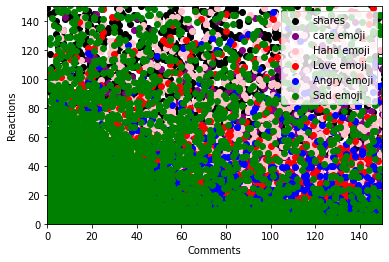

In [44]:
results.reset_index()
plt.xlim(0,150)
plt.ylim(0,150)

plt.xlabel('Comments')
plt.ylabel('Reactions')
plt.scatter(results.Comments, results.Shares,c='black',label='shares')
plt.scatter(results.Comments, results.Haha,c='purple',label='care emoji')
plt.scatter(results.Comments, results.Wow,c='pink',label='Haha emoji')
plt.scatter(results.Comments, results.Love,c='red',label='Love emoji')
plt.scatter(results.Comments, results.Angry,c='blue',label='Angry emoji')
plt.scatter(results.Comments, results.Sad,c='green',label='Sad emoji')

plt.legend()


## Topic Modeling
### Create the Dictionary and Corpus needed for Topic Modeling

In [45]:


# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 3), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 2), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 2), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 2), (50, 1)]]


[[('adelantar', 1),
  ('afrontar', 1),
  ('agarrar', 1),
  ('apasionar', 1),
  ('ayudarnos', 1),
  ('bolsa', 1),
  ('canalizar', 1),
  ('cenar', 1),
  ('comodos', 1),
  ('comprender', 1),
  ('contrastar', 1),
  ('convertirse', 1),
  ('criticar', 1),
  ('dar', 1),
  ('decir', 3),
  ('determinacion', 1),
  ('discursar', 1),
  ('disponer', 1),
  ('estadounidense', 1),
  ('fila', 1),
  ('fuerte', 1),
  ('guiarnos', 1),
  ('hacer', 1),
  ('ignorar', 1),
  ('inimaginable', 1),
  ('levantarnos', 1),
  ('llamar', 1),
  ('manejar', 1),
  ('mascarilla', 1),
  ('mirar', 1),
  ('momento', 2),
  ('necesario', 1),
  ('necesitar', 1),
  ('noche', 1),
  ('numeros', 1),
  ('pais', 1),
  ('pasion', 1),
  ('perdido', 2),
  ('poder', 1),
  ('ponernos', 1),
  ('preparar', 1),
  ('presidente', 1),
  ('recuperar', 1),
  ('sanar', 1),
  ('simplemente', 1),
  ('tambien', 1),
  ('temer', 1),
  ('tensiones_raciales', 1),
  ('testimoniar', 1),
  ('votar', 2),
  ('zapato', 1)]]

## Buiding the Topic Model

In [46]:

# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

## View the topics in LDA model

In [47]:
# Print the Keyword in the 10 topics
#The weights reflect how important a keyword is to that topic.
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.176*"prueba" + 0.094*"ultimar" + 0.089*"vacuno" + 0.082*"despues" + '
  '0.075*"crisis" + 0.072*"vivir" + 0.070*"paciente" + 0.058*"asi" + '
  '0.042*"dejar" + 0.041*"fin"'),
 (1,
  '0.266*"ano" + 0.176*"reportar" + 0.111*"publicar" + 0.099*"pasar" + '
  '0.064*"familia" + 0.060*"riesgo" + 0.050*"vida" + 0.046*"mujer" + '
  '0.023*"luchar" + 0.017*"convertir"'),
 (2,
  '0.206*"poder" + 0.199*"semana" + 0.116*"evitar" + 0.095*"conocer" + '
  '0.090*"importante" + 0.040*"medicos" + 0.034*"capacidad" + '
  '0.026*"septiembre" + 0.026*"traves" + 0.020*"maestro"'),
 (3,
  '0.184*"presidente" + 0.183*"covid" + 0.105*"dia" + 0.098*"estadounidense" + '
  '0.094*"resultar" + 0.064*"noticiar" + 0.063*"superar" + 0.047*"salir" + '
  '0.039*"temer" + 0.019*"representante"'),
 (4,
  '0.200*"millón" + 0.179*"trump" + 0.129*"partir" + 0.113*"contar" + '
  '0.069*"formar" + 0.060*"luego" + 0.043*"mediar" + 0.033*"abrir" + '
  '0.026*"ganar" + 0.024*"mes"'),
 (5,
  '0.181*"http" + 0.130*"debe

## Compute Model Perplexity and Coherence Score

In [48]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -18.7277094470039

Coherence Score:  0.3509369712284203


## Visualize the topics-keywords

In [49]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
16    -0.434472  0.137400       1        1  15.502249
19    -0.043380 -0.144982       2        1   6.268857
17    -0.024140 -0.038548       3        1   5.487759
7     -0.057024 -0.402040       4        1   5.386640
15    -0.006910 -0.000641       5        1   5.227620
4     -0.014546 -0.014536       6        1   5.163948
10    -0.006499  0.001104       7        1   5.136014
1      0.003549  0.013867       8        1   4.994064
12     0.040250  0.042878       9        1   4.881730
11     0.019028  0.030008      10        1   4.845514
3     -0.001842  0.006956      11        1   4.767649
9      0.005859  0.017758      12        1   4.687484
14     0.010497  0.021689      13        1   4.626909
0      0.015322  0.026261      14        1   4.523747
8      0.026939  0.034545      15        1   4.423582
13     0.046897  0.046122      16        1   4.035537
2      0.085071  0.056699      17        1   3.439971
5      0.082463  0.056082      18        1   3.430822
18     0.116178  0.059560      19        1   2.374001
6      0.136759  0.049818      20        1   0.795906, topic_info=                          Term          Freq         Total Category  logprob  \
51                 coronavirus  53251.000000  53251.000000  Default  30.0000   
87                    pandemia  27468.000000  27468.000000  Default  29.0000   
107                       caso  43298.000000  43298.000000  Default  28.0000   
75                       nuevo  24937.000000  24937.000000  Default  27.0000   
144                        ano  16807.000000  16807.000000  Default  26.0000   
245                   positivo  16043.000000  16043.000000  Default  25.0000   
140                   personar  16012.000000  16012.000000  Default  24.0000   
14                       decir  13616.000000  13616.000000  Default  23.0000   
49                       votar  13310.000000  13310.000000  Default  22.0000   
645                     millón  13113.000000  13113.000000  Default  21.0000   
147                  confirmar  12027.000000  12027.000000  Default  20.0000   
139                     muerte  18662.000000  18662.000000  Default  19.0000   
620                      total  11272.000000  11272.000000  Default  18.0000   
104                      trump  11684.000000  11684.000000  Default  17.0000   
41                  presidente  11114.000000  11114.000000  Default  16.0000   
122                      covid  11071.000000  11071.000000  Default  15.0000   
466                   reportar  11131.000000  11131.000000  Default  14.0000   
22                       hacer  10193.000000  10193.000000  Default  13.0000   
537                   aumentar  10682.000000  10682.000000  Default  12.0000   
434                     prueba  10093.000000  10093.000000  Default  11.0000   
38                       poder   9001.000000   9001.000000  Default  10.0000   
606                     semana   8696.000000   8696.000000  Default   9.0000   
13                         dar   9550.000000   9550.000000  Default   8.0000   
204                       http   7874.000000   7874.000000  Default   7.0000   
82                       virus   8228.000000   8228.000000  Default   6.0000   
74                       medir   8387.000000   8387.000000  Default   5.0000   
79                      partir   8459.000000   8459.000000  Default   4.0000   
117                      salud  12031.000000  12031.000000  Default   3.0000   
289                     contar   7364.000000   7364.000000  Default   2.0000   
161                   contagio  11577.000000  11577.000000  Default   1.0000   
51                 coronavirus  53249.636719  53251.398438   Topic1  -1.3053   
107                       caso  43297.230469  43298.992188   Topic1  -1.5122   
139                     muerte  18660.248047  18662.007812   Topic1  -2.3539   
117                      salud  12029.374023  120

## Building LDA Mallet Model

In [50]:
os.getcwd()

'/home/claudia/Documents/Latinx2020'

In [51]:
# Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
from gensim.models.wrappers import LdaMallet


In [52]:
mallet_path = '/home/claudia/Documents/Latinx2020/mallet-2.0.8/bin/mallet' # update this path

In [53]:
ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=20, id2word=id2word)

In [54]:
# Show Topics
pprint(ldamallet.show_topics(formatted=False))

# Compute Coherence Score
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)

[(7,
  [('ciudad', 0.04372079941247246),
   ('cerrar', 0.04145506820632217),
   ('restricción', 0.024829288872915918),
   ('anunciar', 0.02398549932028064),
   ('medir', 0.02242292607465975),
   ('negocio', 0.021516633592199633),
   ('local', 0.0193446567807866),
   ('abrir', 0.019110270793943465),
   ('restaurante', 0.018969639201837585),
   ('alcalde', 0.014625685579011517)]),
 (15,
  [('condado', 0.08042185467385245),
   ('caso', 0.06868302050424333),
   ('aumentar', 0.06443969522393607),
   ('semana', 0.05632472279006381),
   ('nuevo', 0.04265006504367218),
   ('alto', 0.026590472650684507),
   ('numerar', 0.02084494827479403),
   ('tasar', 0.0174843585454996),
   ('estatal', 0.016462243696958433),
   ('fin', 0.01605959239298767)]),
 (18,
  [('usar', 0.039878678948550884),
   ('evitar', 0.03946143723721796),
   ('medir', 0.03708636903424591),
   ('seguir', 0.03639631543473377),
   ('mantener', 0.03007349873222711),
   ('mascarilla', 0.02497031164746285),
   ('tomar', 0.023397631350

## Finding the optimal number of topics for LDA

In [55]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values


In [56]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=2, limit=40, step=6)

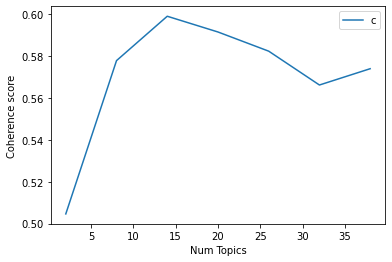

In [57]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [58]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.5046
Num Topics = 8  has Coherence Value of 0.5778
Num Topics = 14  has Coherence Value of 0.5989
Num Topics = 20  has Coherence Value of 0.5914
Num Topics = 26  has Coherence Value of 0.5823
Num Topics = 32  has Coherence Value of 0.5661
Num Topics = 38  has Coherence Value of 0.5739


In [59]:
# Select the model and print the topics
optimal_model = model_list[3]
model_topics = optimal_model.show_topics(formatted=False)
pprint(optimal_model.print_topics(num_words=10))

[(0,
  '0.042*"usar" + 0.038*"pandemia" + 0.026*"seguir" + 0.026*"mascarilla" + '
  '0.025*"mantener" + 0.023*"evitar" + 0.022*"tiempo" + 0.016*"comunidad" + '
  '0.015*"cuidar" + 0.015*"distanciar"'),
 (1,
  '0.475*"coronavirus" + 0.094*"http" + 0.036*"noticiar" + 0.019*"mediar" + '
  '0.016*"septiembre" + 0.013*"paso" + 0.012*"tiempo" + 0.012*"posible" + '
  '0.012*"tomar" + 0.011*"luego"'),
 (2,
  '0.136*"positivo" + 0.095*"dar" + 0.070*"prueba" + 0.069*"covid" + '
  '0.050*"probar" + 0.035*"resultar" + 0.024*"cuarentena" + 0.021*"realizar" + '
  '0.018*"luego" + 0.017*"sintomas"'),
 (3,
  '0.021*"secretario" + 0.020*"trabajar" + 0.019*"emplear" + 0.019*"personal" '
  '+ 0.018*"llamar" + 0.018*"centrar" + 0.015*"director" + 0.014*"sistema" + '
  '0.013*"servicio" + 0.012*"municipio"'),
 (4,
  '0.042*"cerrar" + 0.036*"medir" + 0.023*"actividad" + 0.022*"negocio" + '
  '0.020*"poder" + 0.019*"abrir" + 0.019*"restaurante" + 0.018*"deber" + '
  '0.017*"visitar" + 0.016*"anunciar"'),
 (5

## Finding the dominant topic in each sentence

In [60]:
def format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=data)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,17.0,0.0970,"trump, presidente, decir, despues, debatir, medicar, campana, estadounidense, casa_blanca, ﻿1","La ex primera dama de Estados Unidos Michelle Obama dio un apasionado discurso en el que habló del carácter de Joe Biden para convertirse en presidente y lo contrastó con una fuerte crítica a la administración del presidente Donald Trump por su manejo de la pandemia y las tensiones raciales en el país, entre otros temas. “No puede afrontar este momento. Simplemente no puede ser quien necesitamos que sea para nosotros”, dijo Obama. La ex primera dama dijo que Biden comprende las pérdidas que enfrentan muchos estadounidenses en este momento, pues él mismo ha tenido pérdidas inimaginables. “Su vida es un testimonio de que se ha recuperado y va a canalizar esa misma determinación y pasión para levantarnos a todos, ayudarnos a sanar y guiarnos hacia adelante”. Obama hizo un llamado a votar: “Tenemos que agarrar nuestros zapatos cómodos, ponernos las mascarillas, preparar una bolsa con la cena y tal vez el desayuno también, porque tenemos que estar dispuestos a hacer fila toda la noche si es necesario”, dijo. “Votemos por Joe Biden en números que no pueden ser ignorados”. Mira más aquí:"
1,1,1.0,0.0710,"coronavirus, http, noticiar, mediar, septiembre, paso, tiempo, posible, tomar, luego","Luego de estar recluido 14 días en el hospital, ¡Sebastián lo logró! Bebé de dos meses supera el coronavirus en Mayagüez"
2,2,4.0,0.0758,"cerrar, medir, actividad, negocio, poder, abrir, restaurante, deber, visitar, anunciar",El turismo europeo vuelve a cerrar de golpe por rebrotes de coronavirus
3,3,15.0,0.0904,"virus, paciente, enfermedad, estudiar, mesar, tratar, medicos, covid, tratamiento, revelar","Investigadores dicen que un hombre es el primer caso de reinfección de #covid-19, pero que se necesita investigar más. El estudio, aún no publicado, descubrió que el segundo contagio de #coronavirus del hombre ocurrió 142 días después del primero"
4,4,12.0,0.0843,"ciudad, gobernador, semana, personar, medir, octubre, fin, autoridad, restricción, anunciar",Wanda Vázquez anuncia nuevas medidas contra el COVID-19 Wanda Vázquez anuncia nuevas medidas contra el COVID-19
5,5,15.0,0.0699,"virus, paciente, enfermedad, estudiar, mesar, tratar, medicos, covid, tratamiento, revelar","Los reportes también señalan que cuando el Partido Comunista de China se enteró del virus, trató de esconder todo el alcance de esa información al resto del mundo,"
6,6,4.0,0.0769,"cerrar, medir, actividad, negocio, poder, abrir, restaurante, deber, visitar, anunciar",🎬 ¡Regresa la pantalla grande! #CiudadJuárez Permanecieron cerrados desde marzo debido a la pandemia Abrirán cines hoy a partir de las 4:00 PM
7,7,11.0,0.0639,"nuevo, contagio, caso, millón, cifrar, superar, muerto, coronavirus, fallecido, acordar","Wuhan, la capital de la provincia de Hubei, en China, y epicentro original de la pandemia de covid-19, levantó sus restricciones de viaje en abril."
8,8,4.0,0.0843,"cerrar, medir, actividad, negocio, poder, abrir, restaurante, deber, visitar, anunciar",Wanda Vázquez anuncia nuevas medidas contra el COVID-19 Wanda Vázquez anuncia nuevas medidas contra el COVID-19
9,9,1.0,0.0648,"coronavirus, http, noticiar, mediar, septiembre, paso, tiempo, posible, tomar, luego",¡Buenas noticias! Bebé de dos meses supera el coronavirus en Mayagüez http://ow.ly/9q7I50B9quU:=:


## Find the most representative document for each topic

In [61]:
#We will find the documents a given topic has contributed to the most and infer the topic by reading that document.
# Group top 5 sentences under each topic
sent_topics_sorteddf_mallet = pd.DataFrame()

sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

# Show
pd.set_option('display.max_colwidth', 400)
sent_topics_sorteddf_mallet

,Topic_Num,Topic_Perc_Contrib,Keywords,Text
0,0.0,0.3736,"usar, pandemia, seguir, mascarilla, mantener, evitar, tiempo, comunidad, cuidar, distanciar","Solo en #LonghornPR encuentras una oferta tan irresistible y perfecta como nuestro Dinner for 2 por solo $32.99*. Prueba los NUEVOS Pinchos de sirloin o pollo, con chorizo, vegetales y salsa BBQ, o disfruta de los clásicos: Renegade Sirloin, o el Parmesan Crusted Chicken con el complemento de tu selección. Siempre comenzando con pan ilimitado y dos ensaladas. ¡Llama, reserva u ordena por Recog..."
1,1.0,0.2770,"coronavirus, http, noticiar, mediar, septiembre, paso, tiempo, posible, tomar, luego","Johnny y Cathy fallecieron con tan sólo 4 minutos de diferencia, pues ni la muerte pudo separarlos. Johnny y Cathy fallecieron juntos, con tan sólo 4 minutos de diferencia Pareja casada murió de Covid al mismo tiempo y tomados de las manos http://noticiasya.com/2020/09/11/pareja-casada-murio-de-covid-al-mismo-tiempo-y-tomados-de-las-manos/?cid=facebook_NoticiasYa_Nevada"
2,2.0,0.3614,"positivo, dar, prueba, covid, probar, resultar, cuarentena, realizar, luego, sintomas","El sitio de pruebas comunitarias de saliva para detectar COVID-19 Ya comenzo y estará disponible hasta el Viernes 2 de Octubre en Duluth Entertainment Convention Center de Miércoles a viernes a partir de las 12:00p.m hasta las 7:00p.m. el Sábado y Domingo desde las 10:00a.m. hasta las 4:00 p.m. con dirección en 350 Harbor Dr (Paulucci Hall 2, 3, 4, 5) en Duluth, Minnesota código postal 55802. ..."
3,3.0,0.4973,"secretario, trabajar, emplear, personal, llamar, centrar, director, sistema, servicio, municipio","[LOCALES] Negociado de la Policía mantiene 78 agentes positivos a COVID-19 El comisionado del Negociado de la Policía de Puerto Rico (NPPR), Henry Escalera Rivera, informó el martes, que 78 agentes resultaron positivos a COVID-19. Al momento, se encuentran cerrados 5 cuarteles y/o unidades de trabajo como medida preventiva, estos son: FURA-Marítima de Cabo Rojo Unidad Motorizada Bayamón Precin..."
4,4.0,0.4002,"cerrar, medir, actividad, negocio, poder, abrir, restaurante, deber, visitar, anunciar","Primeros pasos hacia la reapertura de la actividad turística en Centroamérica y el Caribe Por Redacción LA VOZ Los países de Centroamérica y el Caribe han dado a conocer sus primeros pasos hacia la reapertura de la actividad turística. Para ello, han ideado un plan de reactivación basado en la recuperación de la conectividad aérea, así como en el establecimiento de unos protocolos de bioseguri..."
5,5.0,0.3535,"salud, personar, mexico, contagiar, publicar, riesgo, experto, autoridad, influenza, mexicano","Las autoridades de salud de Estados Unidos han advertido al público que se vacune contra la gripe este año para evitar tener que lidiar con el COVID-19 y la gripe simultáneamente. Ambas enfermedades son muy contagiosas y comparten síntomas similares. La gripe, sin embargo, es estacional, mientras que COVID-19 no parece tener una línea de tiempo ya que serpentea por todo el mundo. [ 112 more wo..."
6,6.0,0.2887,"pandemia, coronavirus, detalle, solo, unir, llegar, mundo, paises, listo, mundial",La OPEP ha empeorado su previsión sobre el consumo mundial de crudo en 2020 y 2021 en medio de la creciente incertidumbre sobre el efecto de una segunda oleada de la pandemia en la economía global. La OPEP ha empeorado su previsión sobre el consumo mundial de crudo en 2020 y 2021 en medio de la creciente incertidumbre sobre el efecto de una segunda oleada de la pandemia en la economía global. ...
7,7.0,0.4199,"pandemia, elección, votar, noviembre, latino, temer, candidato, electoral, preguntar, inmigrante","Un tercio de los latinos ya ha votado por correo o de manera anticipada (EFE - El Mexicano News).- Un tercio de los latinos ya ha votado de manera anticipada o por correo de cara a las elecciones del próximo 3 de noviembre, en las que mayoritariamente se siguen decantando por el candidato demócrata, Joe Biden, según una encuesta

In [62]:
sent_topics_sorteddf_mallet.to_csv("DominantTopicsFBGroupsStates.csv",encoding="utf-8-sig",index=False)

In [63]:
## Topic distribution across documents
# Number of Documents for Each Topic
topic_counts = df_topic_sents_keywords['Dominant_Topic'].value_counts()

# Percentage of Documents for Each Topic
topic_contribution = round(topic_counts/topic_counts.sum(), 4)

# Topic Number and Keywords
topic_num_keywords = df_topic_sents_keywords[['Dominant_Topic', 'Topic_Keywords']]

# Concatenate Column wise
df_dominant_topics = pd.concat([topic_num_keywords, topic_counts, topic_contribution], axis=1)

# Change Column names
df_dominant_topics.columns = ['Dominant_Topic', 'Topic_Keywords', 'Num_Documents', 'Perc_Documents']

# Show
df_dominant_topics.dropna(inplace=True)
pd.set_option('display.max_colwidth', None)
df_dominant_topics

,Dominant_Topic,Topic_Keywords,Num_Documents,Perc_Documents
0.0,17.0,"trump, presidente, decir, despues, debatir, medicar, campana, estadounidense, casa_blanca, ﻿1",4065.0,0.0570
1.0,1.0,"coronavirus, http, noticiar, mediar, septiembre, paso, tiempo, posible, tomar, luego",3124.0,0.0438
2.0,4.0,"cerrar, medir, actividad, negocio, poder, abrir, restaurante, deber, visitar, anunciar",4960.0,0.0696
3.0,15.0,"virus, paciente, enfermedad, estudiar, mesar, tratar, medicos, covid, tratamiento, revelar",2438.0,0.0342
4.0,12.0,"ciudad, gobernador, semana, personar, medir, octubre, fin, autoridad, restricción, anunciar",3679.0,0.0516
5.0,15.0,"virus, paciente, enfermedad, estudiar, mesar, tratar, medicos, covid, tratamiento, revelar",3586.0,0.0503
6.0,4.0,"cerrar, medir, actividad, negocio, poder, abrir, restaurante, deber, visitar, anunciar",3203.0,0.0449
7.0,11.0,"nuevo, contagio, caso, millón, cifrar, superar, muerto, coronavirus, fallecido, acordar",3292.0,0.0462
8.0,4.0,"cerrar, medir, actividad, negocio, poder, abrir, restaurante, deber, visitar, anunciar",2154.0,0.0302
9.0,1.0,"coronavirus, http, noticiar, mediar, septiembre, paso, tiempo, posible, tomar, luego",2861.0,0.0401
